In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
%matplotlib inline

In [3]:
import sys
sys.path.insert(0,"../python")

In [4]:
import plotting_scripts as ps

In [5]:
from paperII import load
from cr_zprof import cr_data_load

[1783449361.627471] [stellar-vis1:540433:0]        ib_iface.c:1231 UCX  ERROR mlx5_0: ibv_create_cq(cqe=4096) failed: Cannot allocate memory : Please set max locked memory (ulimit -l) to 'unlimited' (current: 64 kbytes)
[1783449361.627488] [stellar-vis1:540433:0]      ucp_worker.c:1415 UCX  ERROR uct_iface_open(rc_verbs/mlx5_0:1) failed: Input/output error


[stellar-vis1.princeton.edu:540433] pml_ucx.c:309  Error: Failed to create UCP worker


In [6]:
basedir = "/scratch/gpfs/changgoo/tigress_classic/"
model_dict = cr_data_load(basedir,'*b1-*Vmax2-rst')
model_dict.update(cr_data_load(basedir,'*b0.1-*Vmax2'))
# model_dict.update(cr_data_load(basedir,'*b10-*Vmax2-rst'))
model_dict.update(cr_data_load(basedir,'*b10-*Vmax2-rst2'))

Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst
Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-8pc-b0.1-diode-lngrad_out-sigma_selfc-Vmax2
Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-8pc-b10-diode-lngrad_out-sigma_selfc-Vmax2-rst2


In [7]:
model_dict

{'crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst',
 'crmhd-8pc-b0.1-diode-lngrad_out-sigma_selfc-Vmax2': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b0.1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2',
 'crmhd-8pc-b10-diode-lngrad_out-sigma_selfc-Vmax2-rst2': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b10-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst2'}

In [8]:
group="beta"

In [9]:
simgroup, model_name, model_color = load(model_dict,"all",tslice=slice(200,500),
                                         colors=["#E77500","xkcd:olive","xkcd:gold"],verbose=False)

Renamed crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst --> crmhd: crmhd
Renamed crmhd-8pc-b0.1-diode-lngrad_out-sigma_selfc-Vmax2 --> crmhd-b0.1: crmhd-b0.1
Renamed crmhd-8pc-b10-diode-lngrad_out-sigma_selfc-Vmax2-rst2 --> crmhd-b10: crmhd-b10
loading crmhd...
loading crmhd-b0.1...
loading crmhd-b10...
Loaded crmhd in group all with name crmhd and color #E77500
Loaded crmhd-b0.1 in group all with name crmhd-b0.1 and color xkcd:olive
Loaded crmhd-b10 in group all with name crmhd-b10 and color xkcd:gold


In [10]:
s=simgroup["all"]["crmhd-b0.1"]
s.tslice_Myr=slice(400,700)
s.tslice = slice(s.tslice_Myr.start / s.u.Myr, s.tslice_Myr.stop / s.u.Myr)

In [11]:
from load_sim_tigresspp import LoadSimTIGRESSPP
h1 = s.read_hst()
s0 = LoadSimTIGRESSPP("/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b10-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2")
h0 = s0.read_hst()
s=simgroup["all"]["crmhd-b10"]
h=s.merge_hst(hold=h0)

In [12]:
simgroup[group] = {m:s for m,s in simgroup["all"].items() if m != "crmhd"}

In [13]:
for m, s in simgroup["all"].items():
    if s.options["cosmic_ray"]:
        zp_pp = s.load_zprof_postproc()

In [101]:
# zp = s.load_zprof(force_override=True)

In [14]:
ps.setup(f"../{group}_figures", model_name, model_color)

crmhd sfr40 0.003618401188045792 0.0010432405710473064
crmhd-b0.1 sfr40 0.0024566838035754808 0.0005361565978575081
crmhd-b10 sfr40 0.0030513467520949084 0.00047618816691792377
crmhd Sigma_gas 7.856706284548293 10.46718815489521
crmhd-b0.1 Sigma_gas 9.474073384859095 10.8201535881729
crmhd-b10 Sigma_gas 9.063416441404508 9.45227986261729
crmhd Sigma_out 0.8138583323846769 2.3678779846034477
crmhd-b0.1 Sigma_out 0.5821611139085837 1.1266755691688644
crmhd-b10 Sigma_out 1.6920246316923089 2.026925499293596


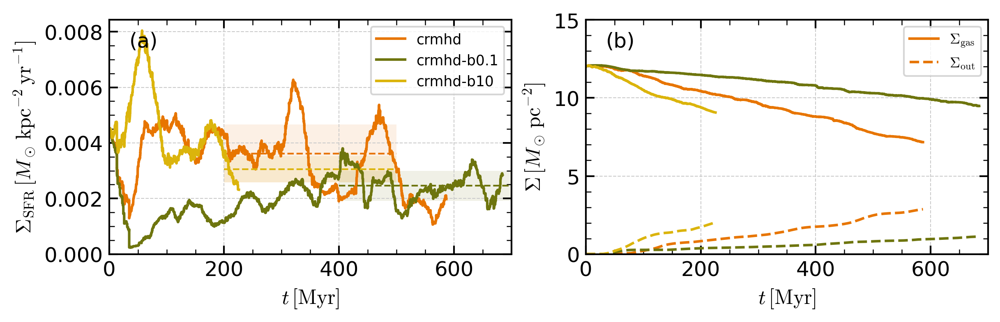

In [15]:
f = ps.plot_history(simgroup,"all",tmin=0,tmax=700)

crmhd Pok_cr 11447.018285197293 11532.766419602736
crmhd 660.0215095496768
crmhd Pok_th 3830.9597928144312 3716.928887483648
crmhd 220.88860194687092
crmhd Pok_kin 13687.906445085444 13741.40249825563
crmhd 789.2284653849782
crmhd Pi_B 1295.534924639588 1297.9121495336415
crmhd 74.69900853925387
crmhd-b0.1 Pok_cr 4141.427574205204 4082.394669495133
crmhd-b0.1 351.708802577436
crmhd-b0.1 Pok_th 2671.0530812857965 2618.877879234717
crmhd-b0.1 226.83793547206685
crmhd-b0.1 Pok_kin 10038.050705755048 9675.093799216202
crmhd-b0.1 852.4767681371899
crmhd-b0.1 Pi_B 7829.525004026642 8008.725968862187
crmhd-b0.1 664.9187543608751
crmhd-b10 Pok_cr 13340.81843583446 13335.09359642173
crmhd-b10 912.1648654988948
crmhd-b10 Pok_th 3083.8353305405535 3061.581354566391
crmhd-b10 210.85409812245257
crmhd-b10 Pok_kin 9436.457881284794 9372.311287038956
crmhd-b10 645.2081913466
crmhd-b10 Pi_B 459.1124014007373 447.55656902060355
crmhd-b10 31.391342584176567
Model    \&        sfr \&   P_cr/k_B \&   P_th

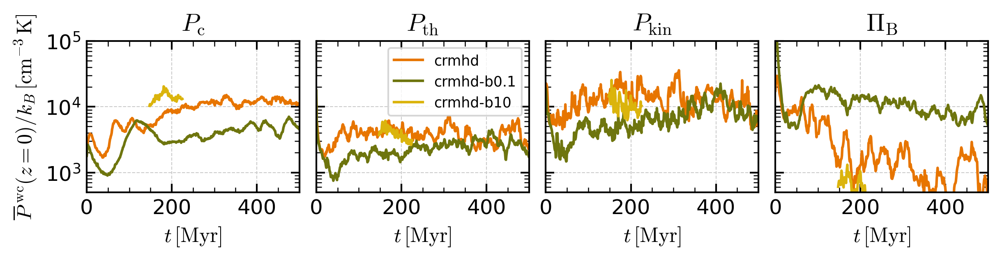

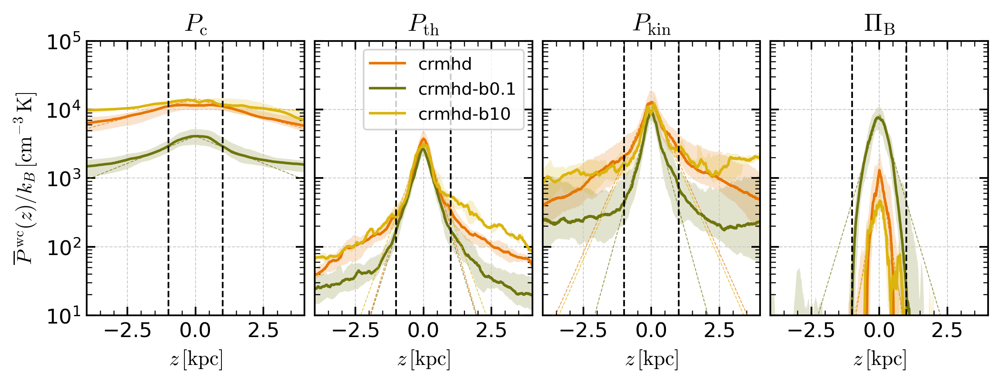

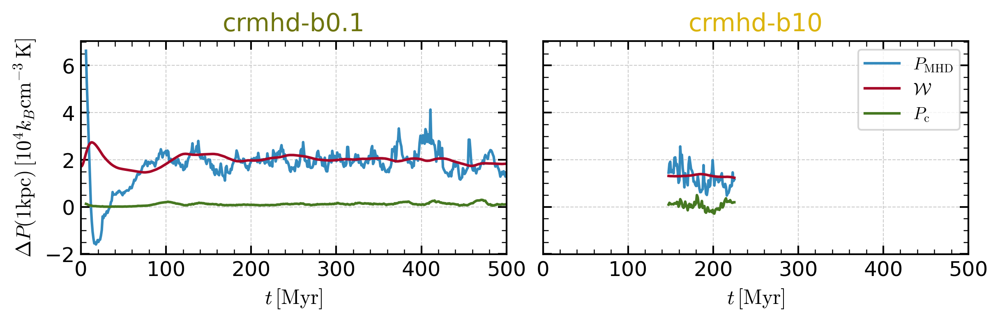

In [17]:
f=ps.plot_pressure_t(simgroup, "all", zslice=slice(-50,50), tmax=500)
f=ps.plot_pressure_z(simgroup, "all")
f=ps.plot_vertical_equilibrium_t(simgroup, group, tmin=0, zmax=1000)

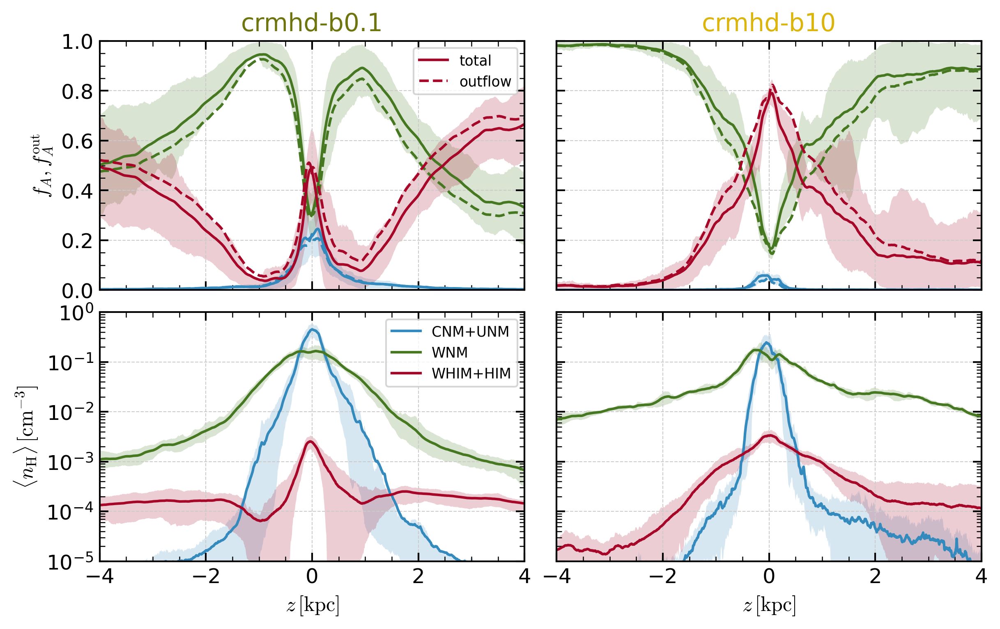

In [18]:
f=ps.plot_area_mass_fraction_z(simgroup, group)

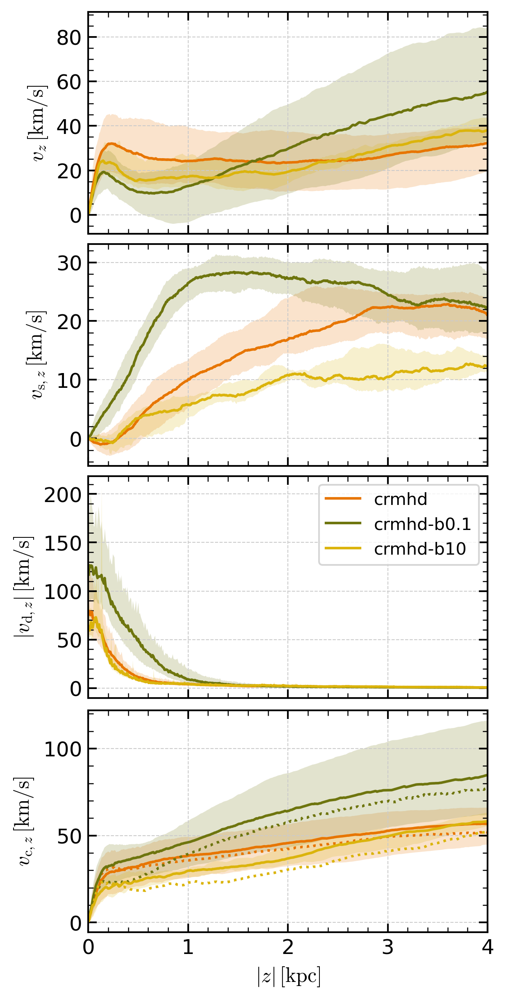

In [19]:
f = ps.plot_cr_velocity_z_all(simgroup, "all")

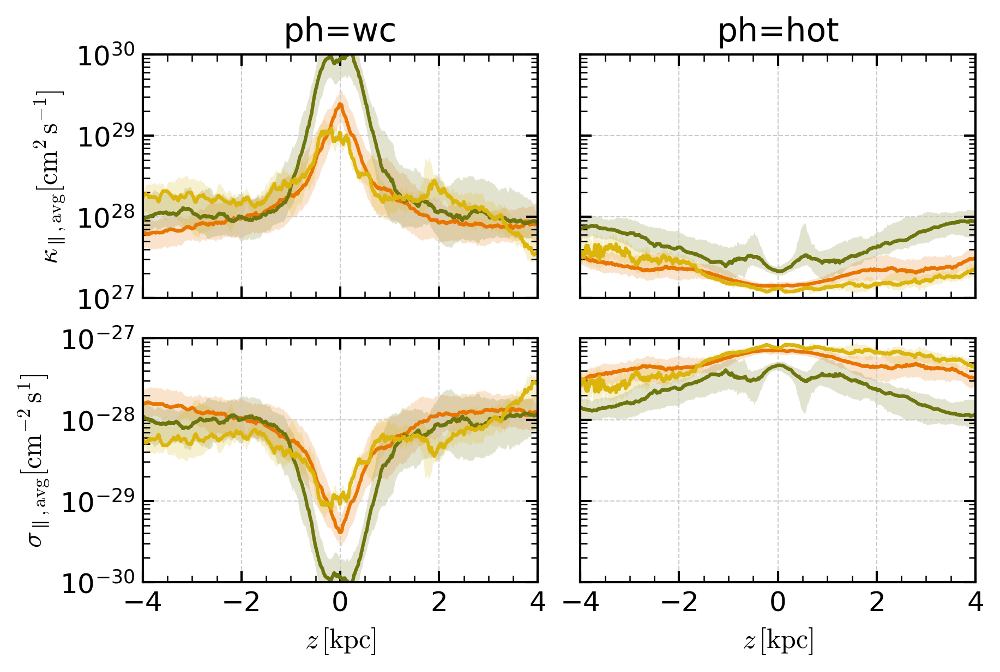

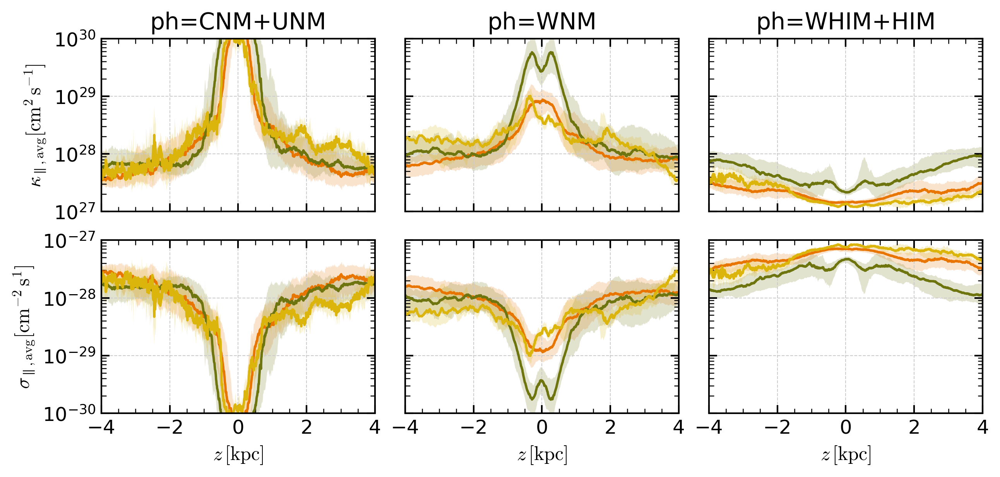

In [20]:
f=ps.plot_kappa_z(simgroup, "all")
f=ps.plot_kappa_z(
    simgroup,
    "all",
    phases=[["CNM", "UNM"], "WNM", ["WHIM", "HIM"]],
)

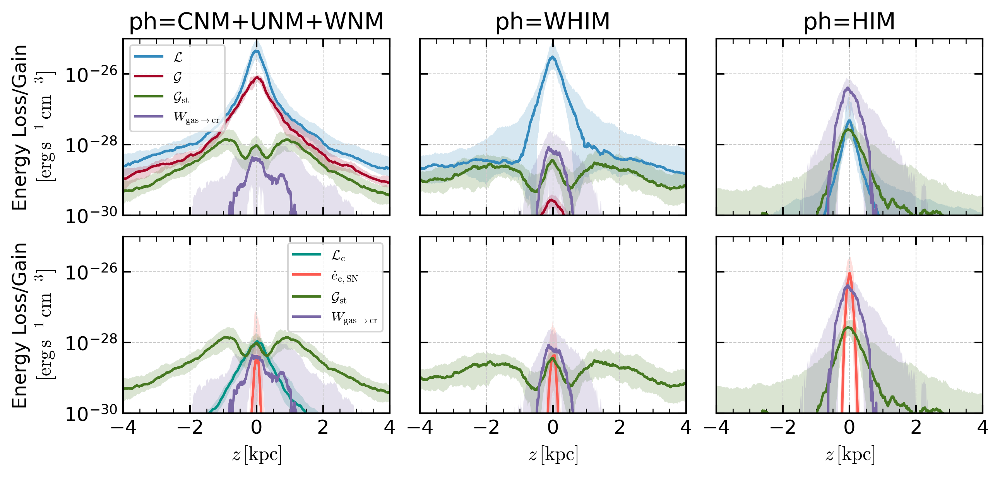

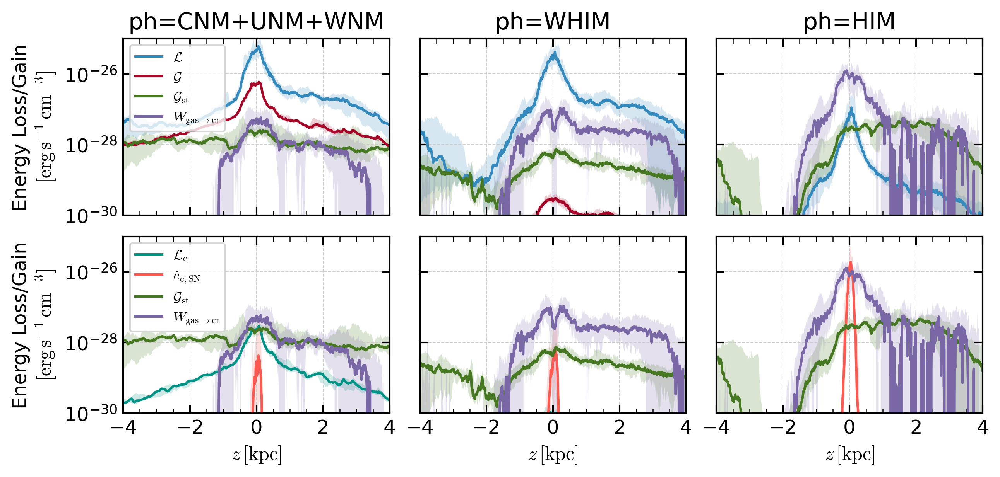

In [21]:
for m, s in simgroup[group].items():
    ps.plot_gainloss_z_each(
        s,
        m,
        phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
    )

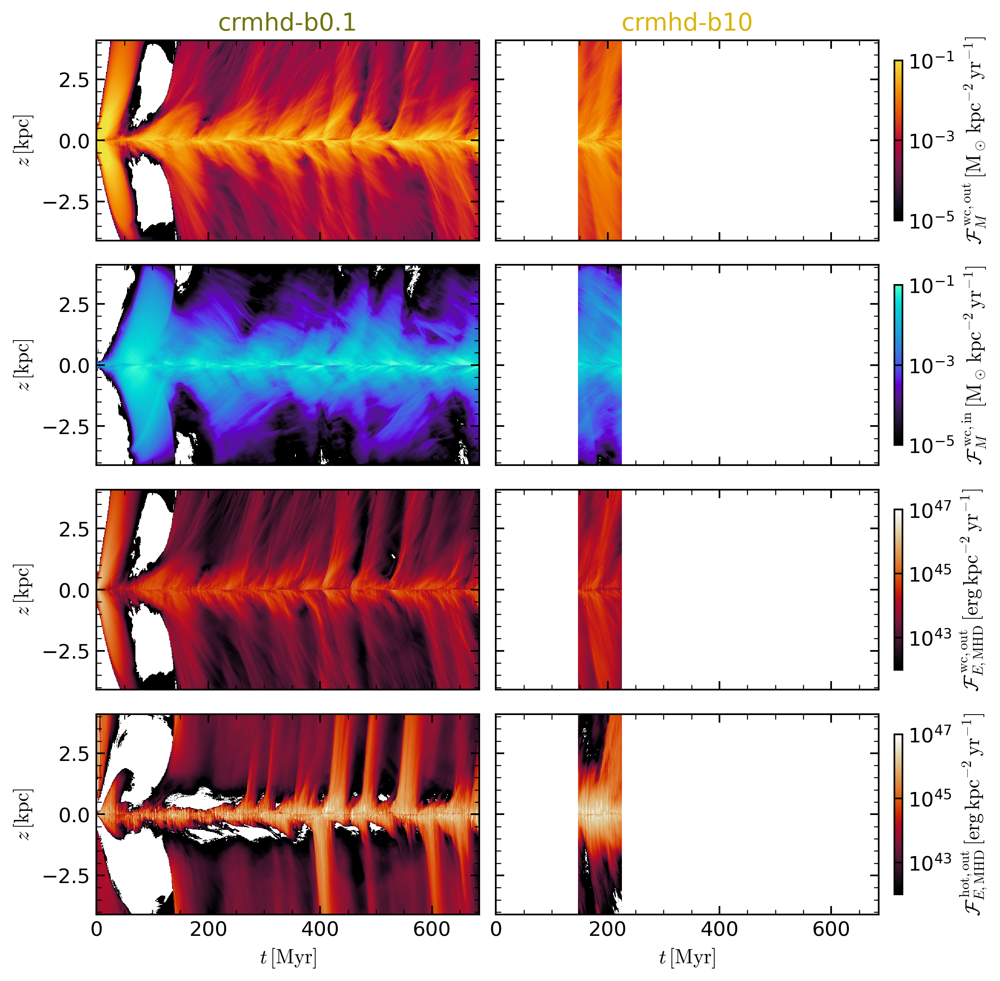

In [22]:
f=ps.plot_flux_tz(simgroup, group)
# f.axes[0].set_xlim(200,500)

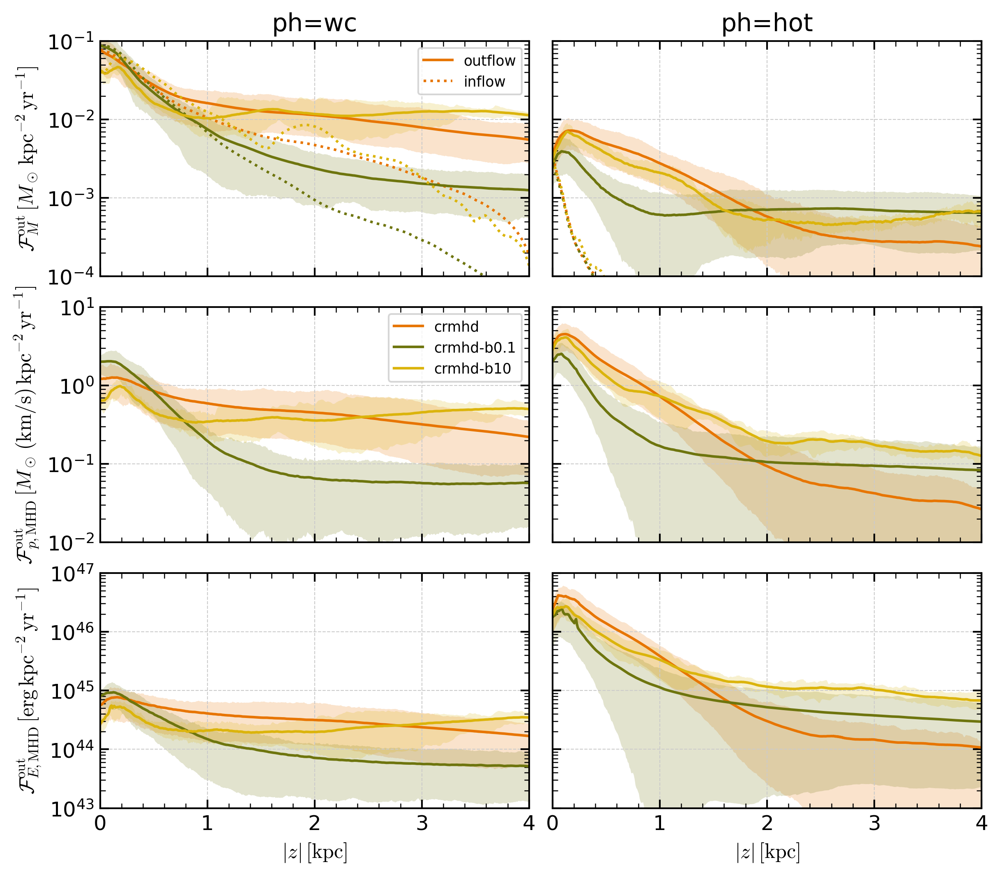

In [23]:
f=ps.plot_flux_z(simgroup, "all", vz_dir=1, both=True)

crmhd ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_M=[2.02224727 2.30682301 2.0011401  1.76274482 1.54367253], eta_p_MHD=[0.70669448 0.32939684 0.13633337 0.08182555 0.05107493], eta_E_MHD=[0.36913047 0.10796348 0.01470456 0.00943772 0.00719071]
crmhd ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_p_CR=[0.84086944 0.89320101 0.76665295 0.62350808 0.54195928], eta_E_CR=[0.26862141 0.33804535 0.34332032 0.31760457 0.29665553]
crmhd-b0.1 ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_M=[-0.79424681  0.50280521  0.86636191  0.78331855  0.76475649], eta_p_MHD=[0.66218031 0.16740504 0.06045912 0.0495037  0.04356293], eta_E_MHD=[0.13510882 0.04588415 0.02191888 0.016477   0.013346  ]
crmhd-b0.1 ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_p_CR=[0.48536693 0.39196594 0.26589112 0.21774741 0.19455672], eta_E_CR=[0.17681161 0.18053078 0.17489541 0.1712622  0.1696782 ]
crmhd-b10 ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kp

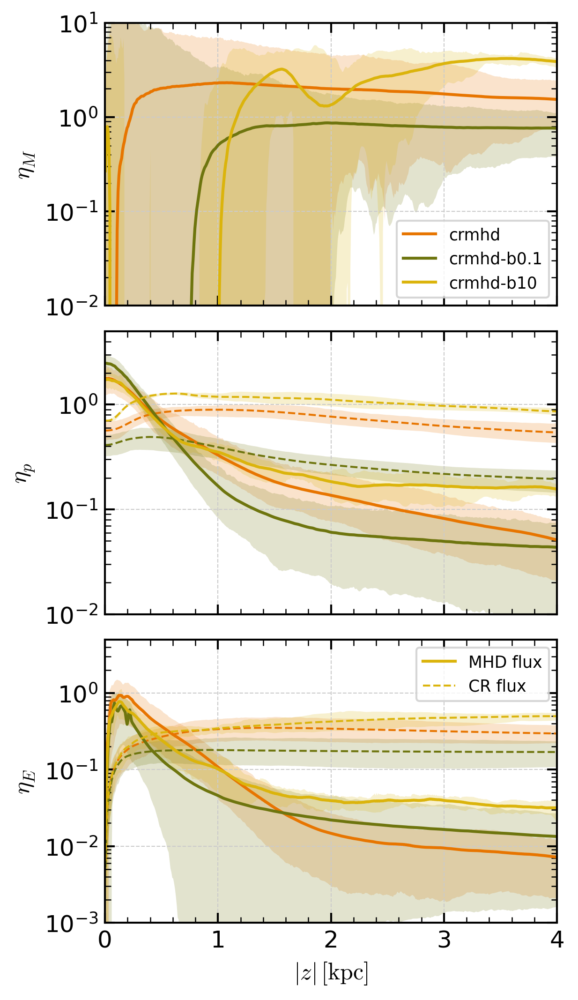

In [24]:
f=ps.plot_loading_z_merged(simgroup, "all", vz_dir=None, both=True)

crmhd 1995.8672936537869
crmhd-b0.1 874.796992636383
crmhd-b10 1458.5949500900945


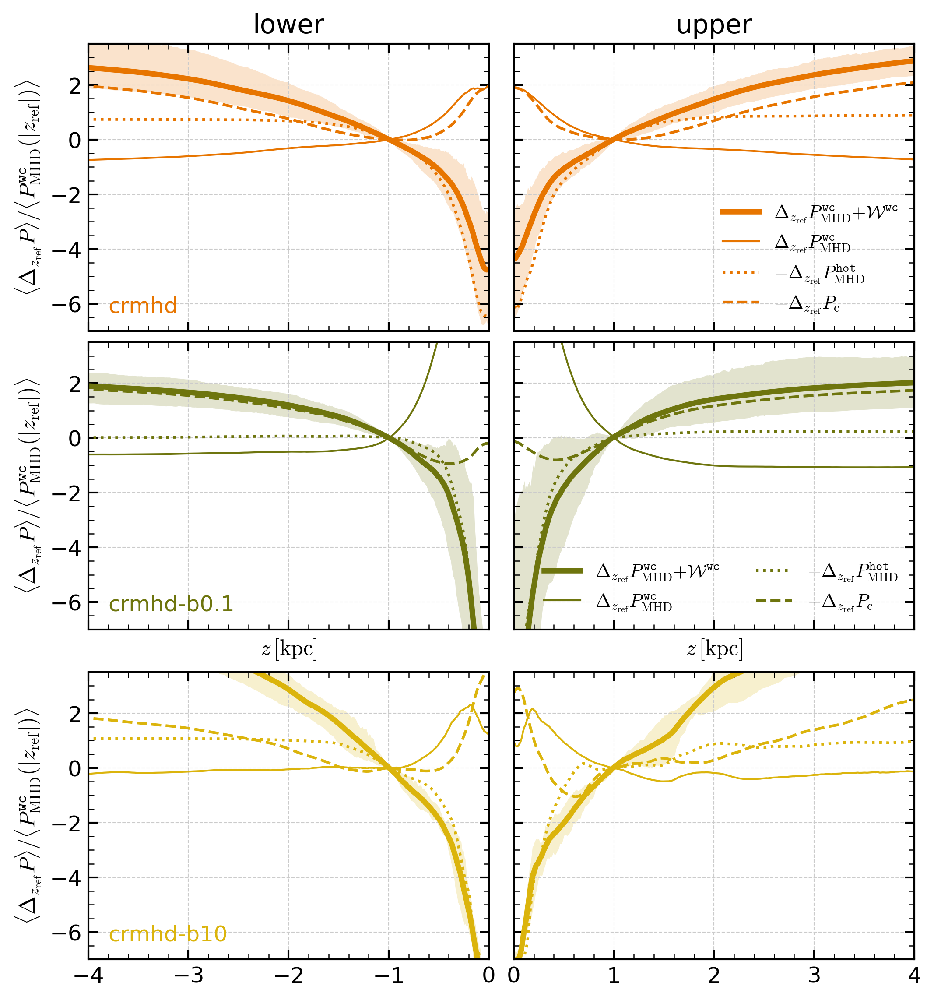

In [25]:
f=ps.plot_momentum_transfer_z(simgroup, "all", show_option=1, zmin=0, zref=1000)
# plt.setp(f.axes,ylim=(-1,3))
# plt.savefig(osp.join(ps.fig_outdir, f"{group}_dflux_1.pdf"))

In [26]:
from cr_zprof import load_windpdf
for m, s in simgroup[group].items():
    load_windpdf(s, both=True)

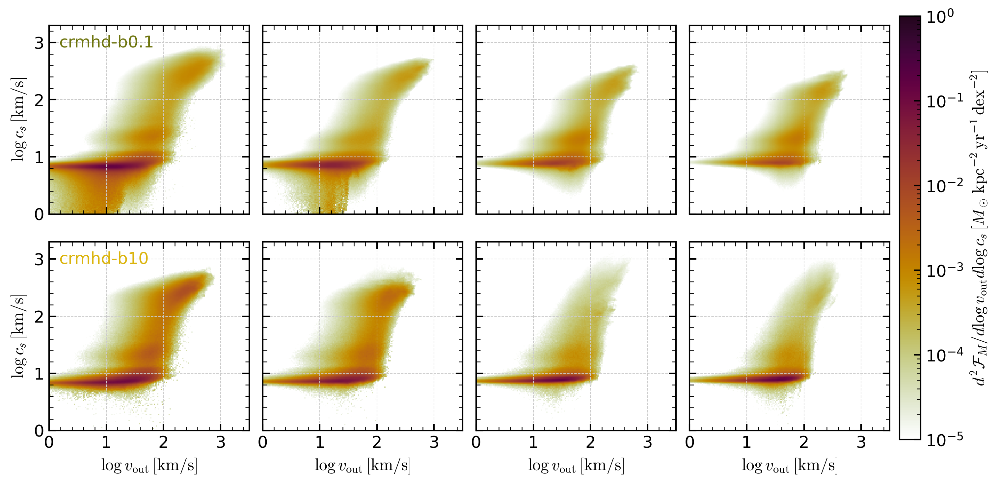

In [27]:
f=ps.plot_jointpdf(simgroup, group)

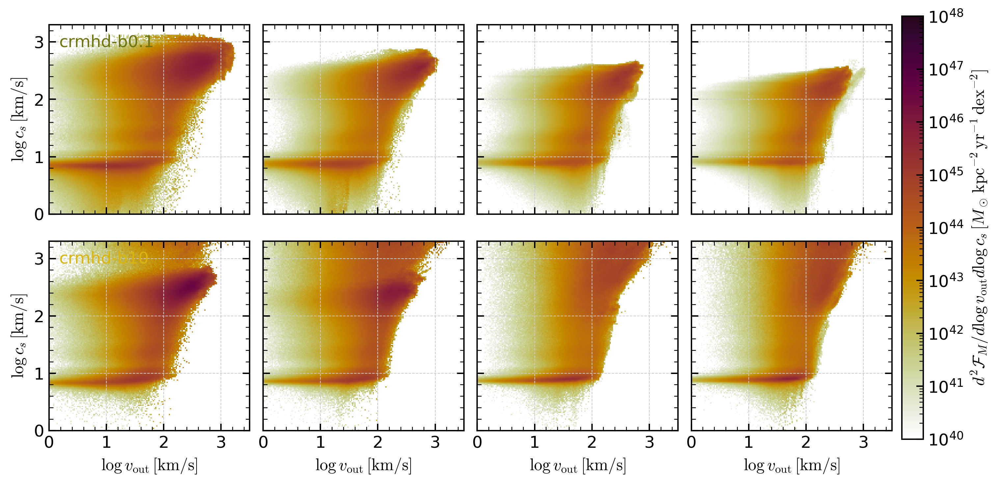

In [28]:
f=ps.plot_jointpdf(simgroup, group, flux="eflux")

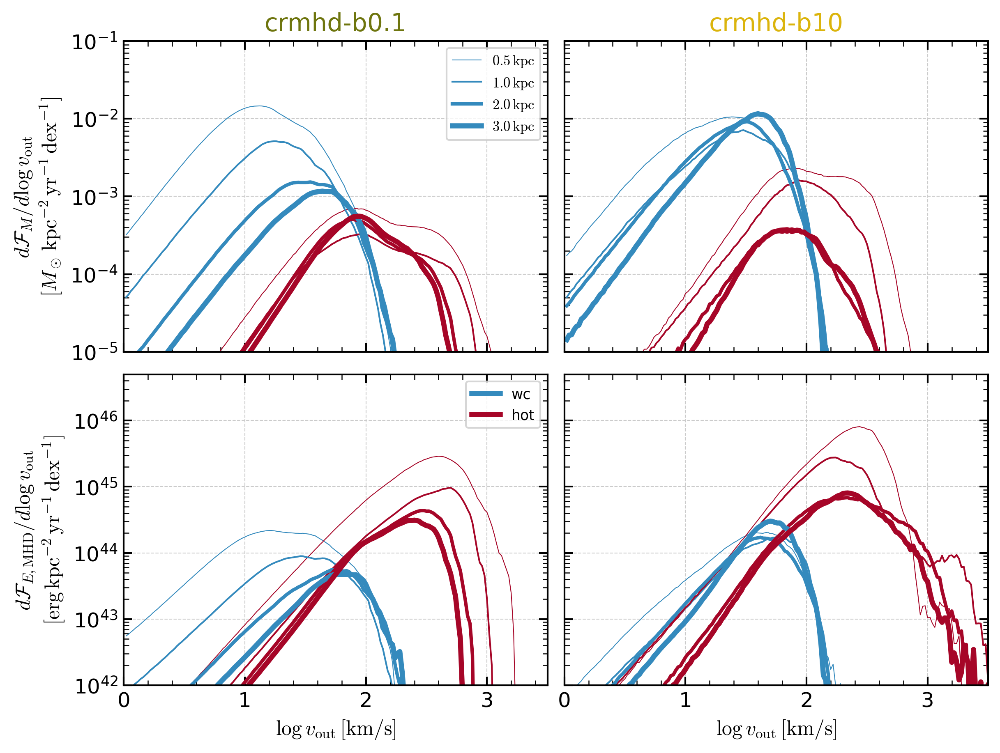

In [29]:
f=ps.plot_voutpdf(simgroup, group)

In [30]:
for m, s in simgroup[group].items():
    print(list(s.zprof.keys()))

['area', 'dens', 'rho', 'Etot', 'press', 'mom1', 'mom2', 'mom3', 'vel1', 'vel2', 'vel3', 'phi', 'phigas', 'smetal', 'rmetal', 'sSN', 'rSN', 'sret', 'rret', 'sCR', 'rCR', '0-Ec', '0-Fc1', '0-Fc2', '0-Fc3', '0-Sigma_diff1', '0-Sigma_adv1', '0-Vs1', '0-Vs2', '0-Vs3', '0-Vd1', '0-Vd2', '0-Vd3', 'Bcc1', 'Bcc2', 'Bcc3', 'edot_cool', 'efloor_cool', 'efloor_ctop', 'fofc', 'rho_added', 'eCRinj', 'mZflux', 'Pturbz', 'gz', 'rhogz', 'Pmag1', 'Pmag2', 'Pmag3', 'vA1', 'vA2', 'vA3', 'cs', 'Ekin1', 'Ekin2', 'Ekin3', 'Ekin_flux1', 'Ekin_flux2', 'Ekin_flux3', 'Eth_flux', 'cool_rate', 'heat_rate', 'Egrav', 'Egflux1', 'Egflux2', 'Egflux3', 'Sz_Bpress', 'Sz_Btens', 'vAz_mag', '0-Veff1', '0-Veff2', '0-Veff3', '0-kappac', '0-Ccr2', '0-rhoCcr2', '0-Ceff2', '0-Ceff2-vz2', '0-Fd_B', '0-GradPc_B', 'rho_ion', 'xion', '0-cooling_cr', '0-heating_cr', '0-work_cr']
['area', 'dens', 'rho', 'Etot', 'press', 'mom1', 'mom2', 'mom3', 'vel1', 'vel2', 'vel3', 'phi', 'phigas', 'smetal', 'rmetal', 'sSN', 'rSN', 'sret', 'rret'

sinj 8.642157485431688e-05
$F_{\rm in,W}$ 0.08078104056607956 0.0906722277932244
$F_{\rm in,SN}$ 0.11143513800823526 0.11143519249911615
$G_{\rm st}$ 0.009195635026222379 0.015732303357446464
$L_{\rm coll}$ 0.0022008632371773966 0.0025574580112185208
$F_{\rm out}$ 0.17681160897243237 0.18050567552027932
$F_{\rm in}$ 0.18081968031091505 0.18381765892367544
sinj 0.00010734071326511463
$F_{\rm in,W}$ 0.23727833535161996 0.2923702563040797
$F_{\rm in,SN}$ 0.10198302445338632 0.10198302451342223
$G_{\rm st}$ 0.01672519722154444 0.0295941411906233
$L_{\rm coll}$ 0.00360674874541296 0.0046316509866078165
$F_{\rm out}$ 0.3049746093675221 0.3472950599749499
$F_{\rm in}$ 0.3189294138380489 0.36012748864027083


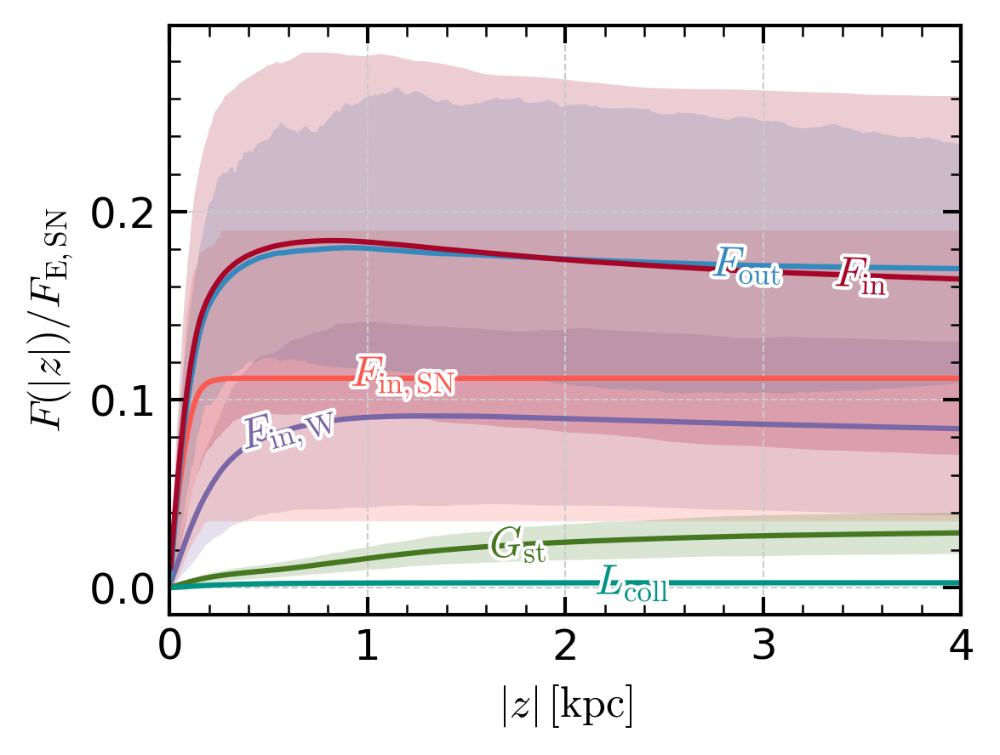

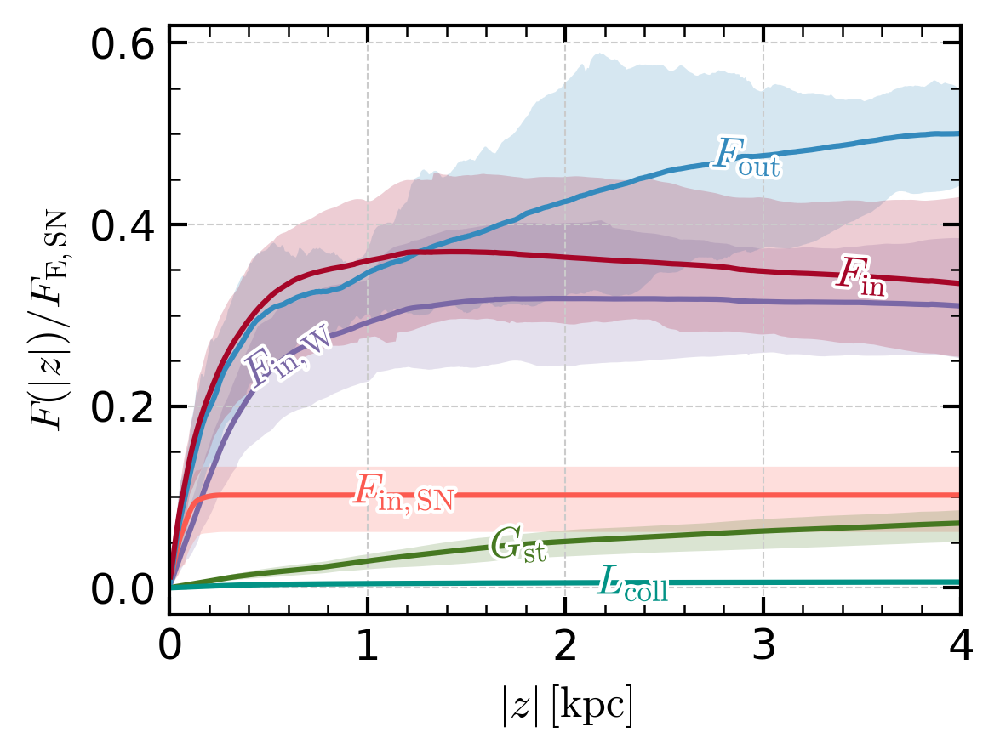

In [31]:
for m, s in simgroup[group].items():
    if s.options["cosmic_ray"]:
        ps.plot_crgain_cumsum(s, m)

        # # will not be used in the paper, but just for checking
        # load_velocity_pdfs(s, xf="T")
        # load_kappa_pdfs(s, xf="T", yf="sigma_para")
        # ps.plot_velocity_T(s, m)

/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/labellines/core.py:181: UserWarning: Tried to label line Line2D(_

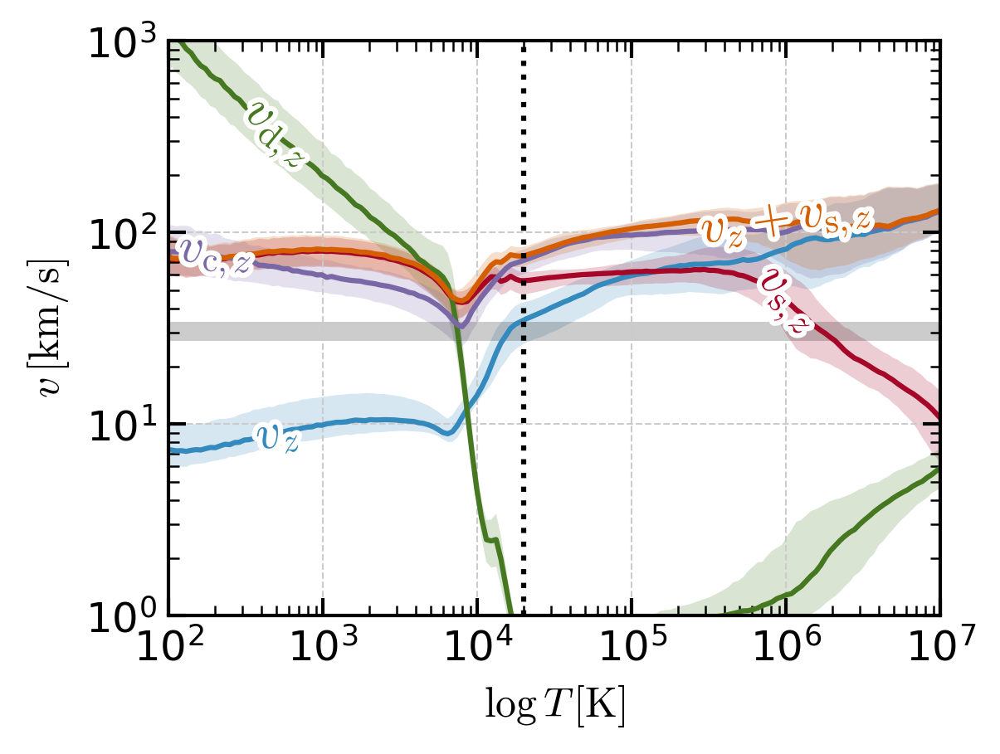

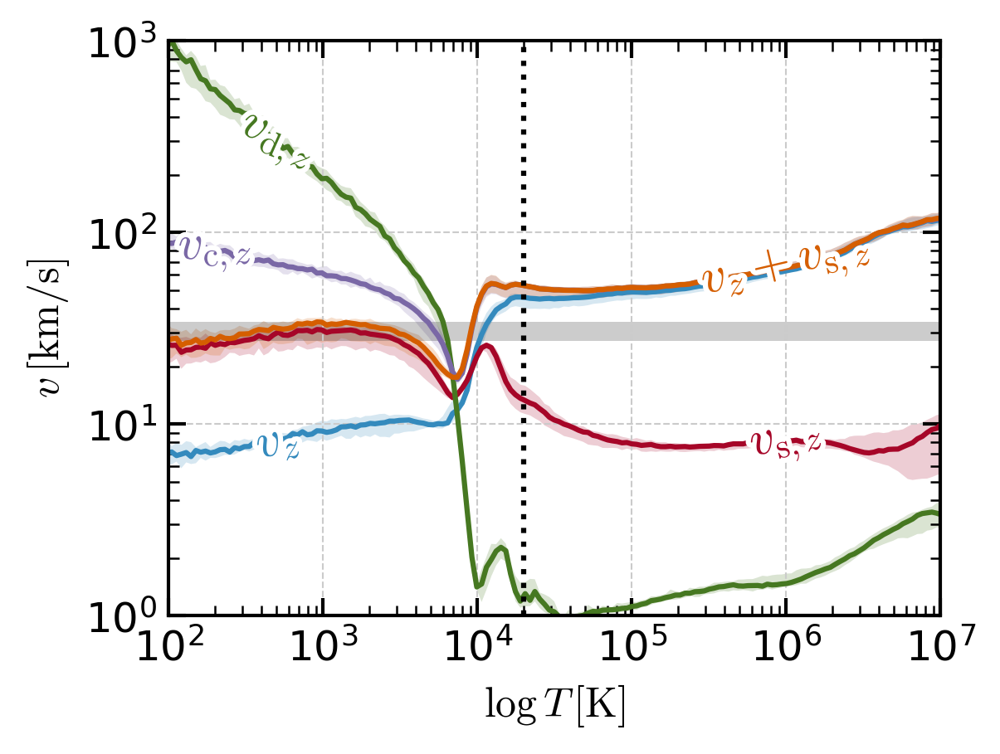

In [32]:
from cr_zprof import load_velocity_pdfs, load_kappa_pdfs
for m, s in simgroup[group].items():
    if s.options["cosmic_ray"]:
        # will not be used in the paper, but just for checking
        load_velocity_pdfs(s, xf="T")
        load_kappa_pdfs(s, xf="T", yf="sigma_para")
        ps.plot_velocity_T(s, m)

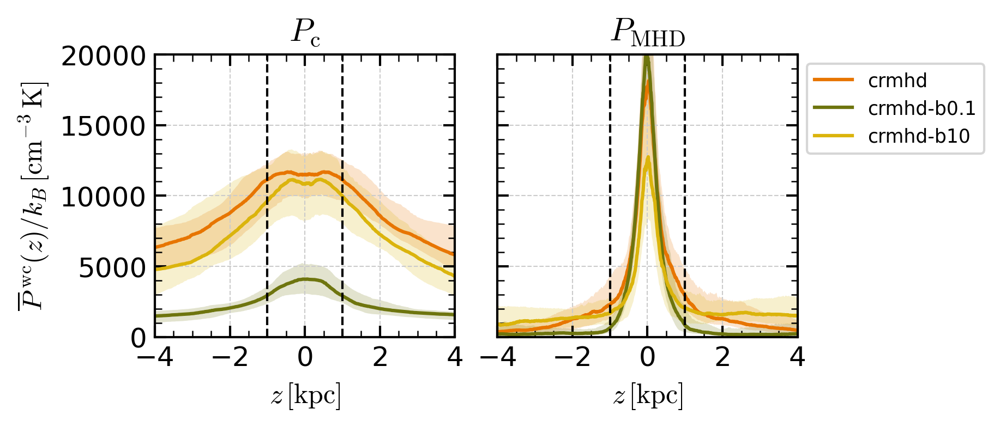

In [141]:
f = ps.plot_pressure_z_talk(simgroup,"all")
plt.setp(f.axes,"ylim",(0,2e4))
f.axes[1].legend(fontsize="x-small", bbox_to_anchor=(1,1))
plt.savefig(os.path.join(ps.fig_outdir, f"all_pressures_z_talk_lin.pdf"))

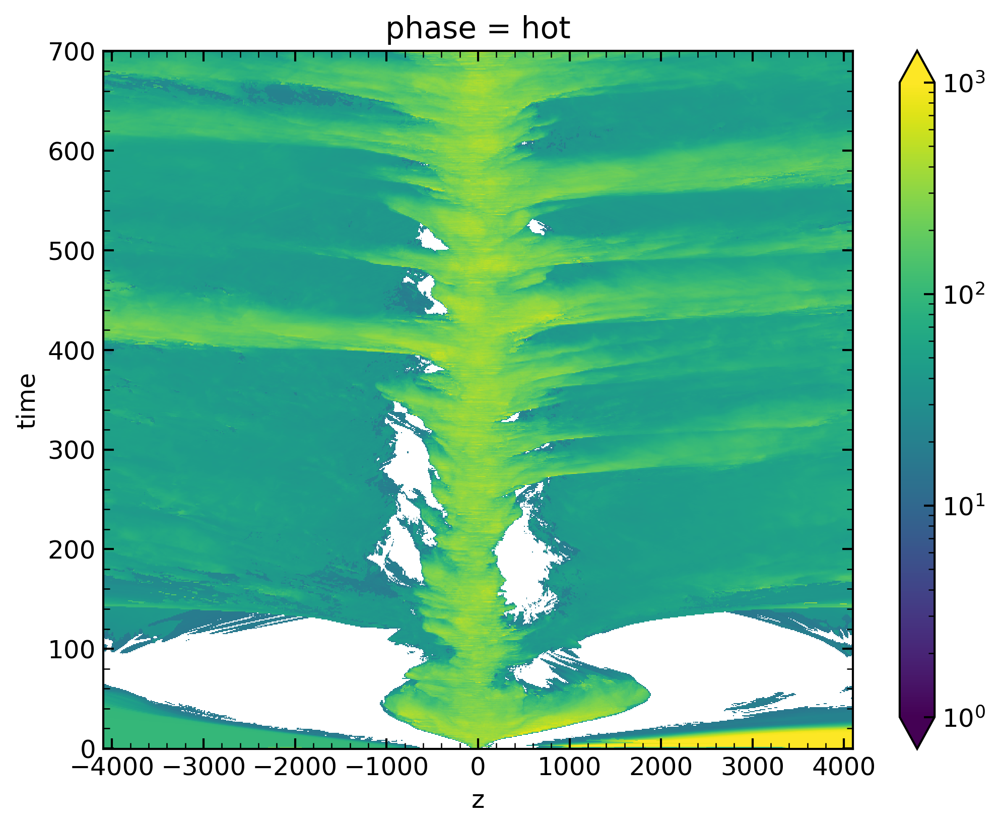

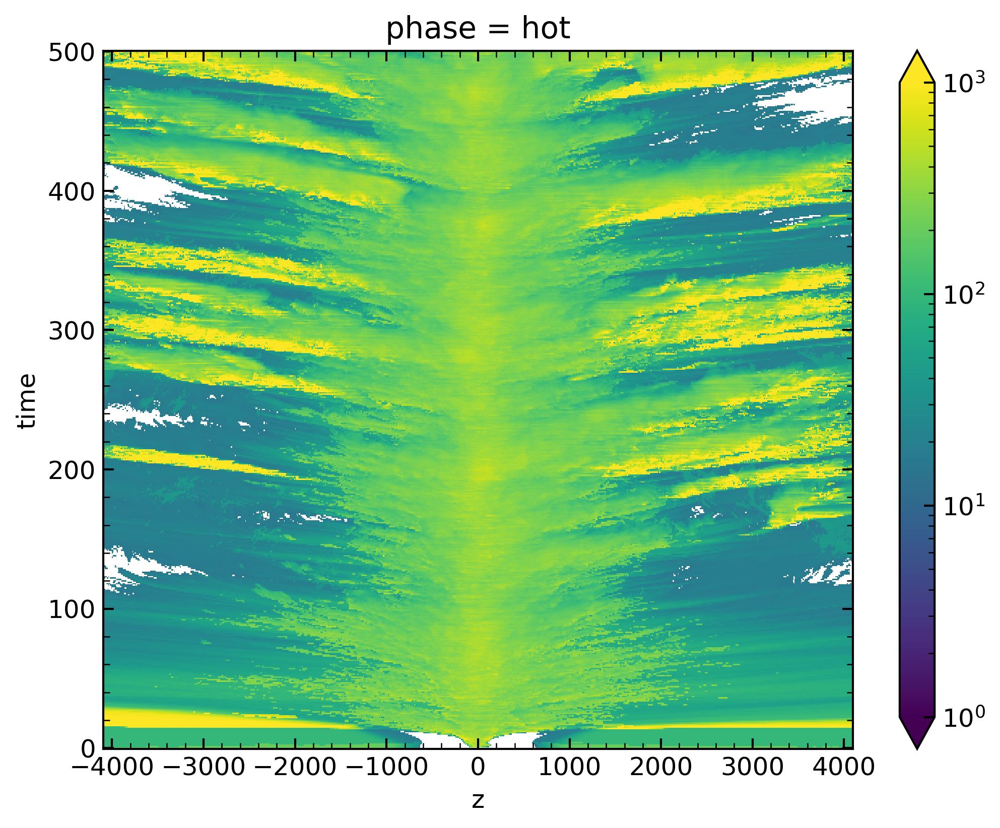

In [144]:
for m, s in simgroup[group].items():
    plt.figure()
    np.sqrt(s.zp_ph["press"]/s.zp_ph["rho"]).sum(dim="vz_dir").sel(phase="hot").plot(norm=LogNorm(1.0,1.e3))